# Analysis of Pirate Attacks Over the Past 30 Years 

###### Christopher Zabriski

### Overview

In 2013 alone, the world economy suffered an estimated loss of 18 billion dollars from Somilian Pirates attacks. (CNN Buisness) Seeing as pirate attacks have such a large impact on global trade it is important to try to understand how to mitigate such attacks from happening in the future. In this report, I will show a step-by-step in-depth analysis of how to collect, process, visualize, analyze, and draw conclusions from data using what information has been recorded on pirate attacks over the last 30 years. 

## 1) Data Collection

The first step in the data life cycle is data collection. In this instance, our data is sotred in a CSV file so we will be using pandas to cleanly extract and manipulate it. 

In [139]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
import numpy as np

#import pirate attacks
raw_pirates = pd.read_csv("pirate_attacks.csv", dtype=object)
raw_pirates

,date,time,longitude,latitude,attack_type,location_description,nearest_country,eez_country,shore_distance,shore_longitude,shore_latitude,attack_description,vessel_name,vessel_type,vessel_status,data_source
0,1993-01-02,NaN,116.9667,19.7,NaN,Hong Kong - Luzon - Hainan,CHN,TWN,357.50237257241855,115.82595611500005,22.746643521000067,NaN,Mv Cosmic Leader,NaN,NaN,mappingpiracy
1,1993-01-04,NaN,116,22.35,NaN,Hong Kong - Luzon - Hainan,CHN,CHN,47.43157252093151,115.82595611500005,22.746643521000067,NaN,Mv Tricolor Star III,NaN,NaN,mappingpiracy
2,1993-01-06,NaN,115.25,19.67,NaN,Hong Kong - Luzon - Hainan,CHN,TWN,280.81187093993,114.30250084700003,22.044867255000042,NaN,Mv Arktis Star,NaN,NaN,mappingpiracy
3,1993-01-08,NaN,124.5833,29.9,NaN,East China Sea,CHN,CHN,209.92339619754955,122.40967858200008,29.91120026200008,NaN,Ussurijsk,NaN,NaN,mappingpiracy
4,1993-01-12,NaN,120.2667,18.1333333,NaN,Hong Kong - Luzon - Hainan,PHL,PHL,22.027332077847085,120.47006269600001,18.091009833000044,NaN,Mv Chennai Nermai,NaN,NaN,mappingpiracy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7506,2020-12-15,02:15 UTC,4.751944444444445,2.0008333333333335,Boarded,Around 165nm SSW of Brass,STP,STP,269.4399372191954,6.49781334700009,0.312689520000049,15.12.2020: 0215 UTC: Posn: 02:00.3N - 004:45....,NaN,Product Tanker,NaN,imb
7507,2020-12-19,13:36 UTC,6.1691666666666665,2.602222222222222,Boarded,Around 100nm South of Brass,STP,STP,168.40799263499858,7.3718367850000845,1.6771914730000503,19.12.2020: 1336 UTC: Posn: 02:36.8N – 006:10....,NaN,Container,NaN,imb
7508,2020-12-21,04:09 UTC,5.616666666666667,2.6166666666666667,Boarded,"Around 107nm SSW of Brass, Nigeria",NGA,NGA,191.1827909196955,6.112803582000083,4.272162177000041,"21.12.2020: 0409 UTC: Posn : 02:37N – 005:37E,...",NaN,Container,NaN,imb
7509,2020-12-26,01:30 UTC,-1.6833333333333333,4.883333333333333,Boarded,Takoradi Anchorage,GHA,GHA,6.288179743331335,-1.7188207669999542,4.927679755000042,26.12.2020: 0130 UTC: Posn: 04:53.51N – 001:41...,NaN,General Cargo,Anchored,imb


## 2) Data Parsing and Management

The second step in the data life cycle involves processing raw data into useable information. In this section we will be removing columns of the dataframe that we will not be using, breaking apart the date of each attack into seperate year and month values, and sorting the dataframe by year from oldest to most recent. Next, we will place the different types of vessels that get attacked into a subset of categories that we will use to find trends later. Finaly, we will condense each pirate attack's location from nearest country to continent.

In [141]:
#drop the columns that we will not be using
pirates = raw_pirates[['date', 'longitude', 'latitude', 'attack_type', 'nearest_country', 'vessel_name', 'vessel_type']].copy()

#We only care about the year, not month or day
pirates['Year'] = pirates['date'].str.slice(0,4)
pirates['Month'] = pirates['date'].str.slice(5,7)
pirates = pirates.drop('date', 1)

#Sort by year
pirates.sort_values(['Year'])
pirates['Year'] = pirates['Year'].astype(int)

#Update what kind of ship it is
for idx, row in pirates.iterrows():
    if re.search("Tanker", str(row['vessel_type'])) or re.search("TANKER", str(row['vessel_type'])):
        pirates.at[idx,'vessel_type'] = "Tanker"
    elif re.search("Carrier", str(row['vessel_type'])) or re.search("CARRIER", str(row['vessel_type'])):
        pirates.at[idx,'vessel_type'] = "Carrier"
    elif re.search("Container", str(row['vessel_type'])) or re.search("CONTAINER", str(row['vessel_type'])):
        pirates.at[idx,'vessel_type'] = "Container"
    elif re.search("Cargo", str(row['vessel_type'])) or re.search("CARGO", str(row['vessel_type'])):
        pirates.at[idx,'vessel_type'] = "Cargo"
    elif re.search("Supply", str(row['vessel_type'])) or re.search("SUPPLY", str(row['vessel_type'])):
        pirates.at[idx,'vessel_type'] = "Supply"
    elif re.search("Tug", str(row['vessel_type'])) or re.search("TUG", str(row['vessel_type'])):
        pirates.at[idx,'vessel_type'] = "Tug"
    elif str(row['vessel_type']) == "nan":
        pirates.at[idx, 'vessel_type'] = "Unknown"
    else:
        pirates.at[idx,'vessel_type'] = "Other"


#Update neareast country to neareast continent
for idx, row in pirates.iterrows():
    if re.search("IDN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("SGP", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("COL", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("NGA", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("GHA", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("CIV", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("VNM", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("MYS", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("PHL", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("COG", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("IND", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("BGD", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("THA", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("GIN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("HTI", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("COD", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("MOZ", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("CMR", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("KEN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("VEN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("LBR", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("EGY", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("YEM", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("CHN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("KEN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("GUY", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("STP", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("ZAF", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("AGO", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("MAR", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("SOM", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("BEN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("ECU", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("SLE", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("ERI", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("OMN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    elif re.search("SEN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("GTM", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("BRA", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("GAB", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("TGO", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("DOM", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("PAN", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("GNQ", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("MEX", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "South America"
    elif re.search("DZA", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Africa"
    elif re.search("IRQ", str(row['nearest_country'])):
        pirates.at[idx, 'nearest_country'] = "Asia"
    else:
        pirates.at[idx, 'nearest_country'] = "NaN"
pirates.rename(columns = {'nearest_country':'continent'}, inplace=True) 
    

pirates

,longitude,latitude,attack_type,continent,vessel_name,vessel_type,Year,Month
0,116.9667,19.7,NaN,Asia,Mv Cosmic Leader,Unknown,1993,01
1,116,22.35,NaN,Asia,Mv Tricolor Star III,Unknown,1993,01
2,115.25,19.67,NaN,Asia,Mv Arktis Star,Unknown,1993,01
3,124.5833,29.9,NaN,Asia,Ussurijsk,Unknown,1993,01
4,120.2667,18.1333333,NaN,Asia,Mv Chennai Nermai,Unknown,1993,01
...,...,...,...,...,...,...,...,...
7506,4.751944444444445,2.0008333333333335,Boarded,Africa,NaN,Tanker,2020,12
7507,6.1691666666666665,2.602222222222222,Boarded,Africa,NaN,Container,2020,12
7508,5.616666666666667,2.6166666666666667,Boarded,Africa,NaN,Container,2020,12
7509,-1.6833333333333333,4.883333333333333,Boarded,Africa,NaN,Cargo,2020,12


## 3) Data Visualization

The third step in the data life cycle is in regards to visualizing data. In this step we will be using several graphs and maps to see how pirate attacks have changed over time in regards to number of attacks, attacks on each vessel type, or attacks at a certian location.

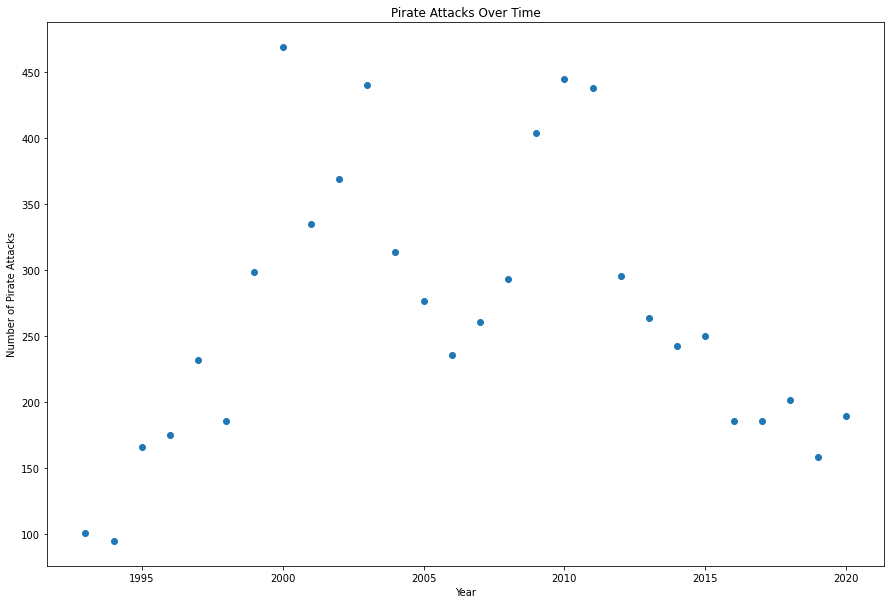

In [142]:
#create a graph that shows the number of pirate attacks over time
num_attacks = {}

for idx, row in pirates.iterrows():
    if row["Year"] not in num_attacks:
        num_attacks[row['Year']] = 1
    else:
        num_attacks[row['Year']] = num_attacks[row['Year']] + 1
        
years = list(num_attacks.keys())
num = list(num_attacks.values())

plt.figure(figsize=(15,10))
plt.plot(years, num, 'o')

plt.title("Pirate Attacks Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Pirate Attacks")
plt.show()

Here we can see that pirate attacks have spiked in 2000, 2003, and 2009-2011, as the graph creates a sort of M shape indicating a large fluctuation of attacks. As we look more at the shape of the graph we can start to recognize the potential for some fourm of a polynomial trend that the number of pirate attacks per year seems to follow.

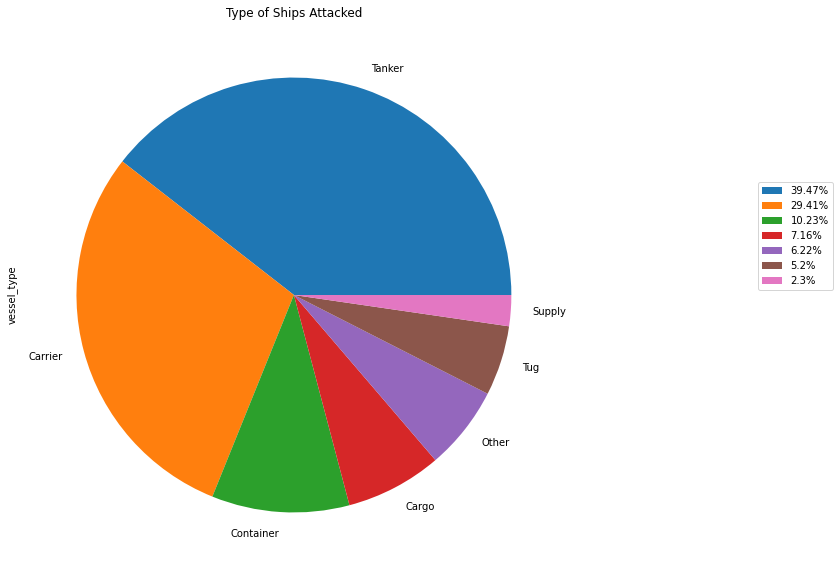

In [143]:
#Create a pie graph that shows the types of ships that were attacked
percents = []

#ship_types do not start being recorded until the 6338th entry
#we assume that there is a similar attack pattern beforehand
recorded_ships = pirates.iloc[6338:]

ship_types = recorded_ships['vessel_type'].value_counts()

for ship in ship_types:
    percents.append(str(round(ship/ship_types.sum()*100,2))+"%")
    
ship_types.plot.pie(figsize = (10,10), title = "Type of Ships Attacked")
plt.legend(labels = percents, loc = 'lower right', bbox_to_anchor = (1.5,.5))
plt.show()

From what information we have we can see that the majority of pirates focus their attacks on larger vessels such as tankers, carriers, container ships, and cargo ships. This would lead us to assume that these pirate bands contain enough members to take over such large ships, which indicates an element of orginization and a leadership higherarchy necessary to coordinate attacks of this size. While we can see that some attacks do occur on smaller vessels, the majority of the problem is defending ships with large amounts of cargo. 

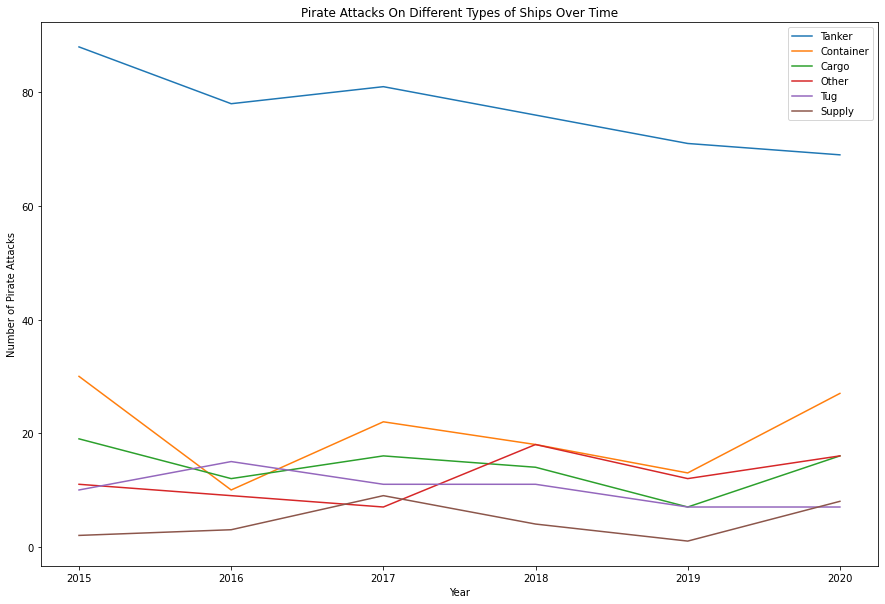

In [144]:
#Create a plot that shows the types of ships attacked over time
temp_pirates = pirates[pirates['Year'] >= 2015].copy()
years = [2015, 2016, 2017, 2018, 2019, 2020]
attacks_per_year = []

#split the data into each year, can either do with a loop 
for year in years:
    period = temp_pirates.groupby(['Year']).get_group(year)
    attacks_per_year.append(period)
    
Tanker = []
Carrier = []
Container = []
Cargo = []
Other = []
Tug = []
Supply = []

for attacks in attacks_per_year:
    tank_sum = carr_sum = cont_sum = carg_sum = othe_sum = tug_sum = supp_sum = barg_sum = 0
    
    for idx, row in attacks.iterrows():
        if row['vessel_type'] == "Tanker":
            tank_sum = tank_sum + 1
        elif row['vessel_type'] == "Carrier":
            carr_sum = carr_sum + 1
        elif row['vessel_type'] == "Container":
            cont_sum = cont_sum + 1
        elif row['vessel_type'] == "Cargo":
            carg_sum = carg_sum + 1
        elif row['vessel_type'] == "Other":
            othe_sum = othe_sum + 1
        elif row['vessel_type'] == "Tug":
            tug_sum = tug_sum + 1
        elif row['vessel_type'] == "Supply":
            supp_sum = supp_sum + 1
    
    Tanker.append(tank_sum)
    Container.append(cont_sum)
    Cargo.append(carg_sum)
    Other.append(othe_sum)
    Tug.append(tug_sum)
    Supply.append(supp_sum)

#want to see multiple lines on the same plot
plt.figure(figsize=(15,10))
plt.plot(years, Tanker, label = "Tanker")
plt.plot(years, Container, label = "Container")
plt.plot(years, Cargo, label = "Cargo")
plt.plot(years, Other, label = "Other")
plt.plot(years, Tug, label = "Tug")
plt.plot(years, Supply, label = "Supply")

plt.title("Pirate Attacks On Different Types of Ships Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Pirate Attacks")
plt.legend()
plt.show()

Here we can observe that tankers, while being the type of vessel that is most frequently attacked by pirate orginizations, have slowly seen a decrease in attacks over time. However, it does not seem like we can observe a relationship between time and the other types of ships that are attacked as their fluctuations do not look to have trends. 

In [145]:
#create 5 maps that display pirate attacks in different time periods

#discretize 1995-2020 into 5 periods by assigning each team a value within a 5 year period
periods = ['1995-99', '2000-04', '2005-09', '2010-14', '2015-20']
bins = [1995, 2000, 2005, 2010, 2015, 2020]
temp_pirates = pirates[pirates['Year'] >= 1995].copy()
temp_pirates['category'] = pd.cut(temp_pirates['Year'],bins,right=False, labels=periods)

#first period
period_table = temp_pirates.groupby('category').get_group('1995-99')
    
temp_map = folium.Map(location=[0,0], zoom_start=2)
cluster = MarkerCluster(name="Attacks").add_to(temp_map)
    
for idx, row in period_table.iterrows():
    folium.Marker(
        location = [row['latitude'], row['longitude']],
        popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
        icon=folium.Icon(color="black", icon="flash")
    ).add_to(cluster)
        
temp_map

From this map we can see that from 1995-1999 the majority of recorded pirate attacks occured in Southeast Asia, with other smaller frequent locations being India, and the East and West coasts of Africa. 

In [146]:
#Second period
period_table = temp_pirates.groupby('category').get_group('2000-04')
    
temp_map = folium.Map(location=[0,0], zoom_start=2)
cluster = MarkerCluster(name="Attacks").add_to(temp_map)
    
for idx, row in period_table.iterrows():
    folium.Marker(
        location = [row['latitude'], row['longitude']],
        popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
        icon=folium.Icon(color="black", icon="flash")
    ).add_to(cluster)
        
temp_map

In the second map we can see a dramatic increase in pirate attacks not only in Southeast Asia, but also along the African coasts and Northern regions of South America. This is also the first, and only, time we see pirate attacks on the United States.

In [147]:
#Third period
period_table = temp_pirates.groupby('category').get_group('2005-09')
    
temp_map = folium.Map(location=[0,0], zoom_start=2)
cluster = MarkerCluster(name="Attacks").add_to(temp_map)
    
for idx, row in period_table.iterrows():
    folium.Marker(
        location = [row['latitude'], row['longitude']],
        popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
        icon=folium.Icon(color="black", icon="flash")
    ).add_to(cluster)
        
temp_map

In the third map we see that pirate attacks in Southeast Asia have been cut in half. We now see a dramatic increase in attacks in the Arabian sea.

In [149]:
#Fourth period
period_table = temp_pirates.groupby('category').get_group('2010-14')
    
temp_map = folium.Map(location=[0,0], zoom_start=2)
cluster = MarkerCluster(name="Attacks").add_to(temp_map)
    
for idx, row in period_table.iterrows():
    folium.Marker(
        location = [row['latitude'], row['longitude']],
        popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
        icon=folium.Icon(color="black", icon="flash")
    ).add_to(cluster)
        
temp_map

In the fourth map we can solidy the trends that the majority of pirate attacks are located in Southeast Asia, the Arabian Sea, and along the coasts of Africa, with a few attacks in the caribbean and Northern parts of South America.

In [150]:
#Fifth period
#We will indicate the different marker colors 
period_table = temp_pirates.groupby('category').get_group('2015-20')
    
temp_map = folium.Map(location=[0,0], zoom_start=2)
cluster = MarkerCluster(name="Attacks").add_to(temp_map)
    
    
for idx, row in period_table.iterrows():
    if row['vessel_type'] == "Tanker":
        folium.Marker(
            location = [row['latitude'], row['longitude']],
            popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
            icon=folium.Icon(color="blue", icon="flash")
        ).add_to(cluster)
    elif row['vessel_type'] == "Carrier":
        folium.Marker(
            location = [row['latitude'], row['longitude']],
            popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
            icon=folium.Icon(color="orange", icon="flash")
        ).add_to(cluster)
    elif row['vessel_type'] == "Container":
        folium.Marker(
            location = [row['latitude'], row['longitude']],
            popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
            icon=folium.Icon(color="green", icon="flash")
        ).add_to(cluster)
    elif row['vessel_type'] == "Cargo":
        folium.Marker(
            location = [row['latitude'], row['longitude']],
            popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
            icon=folium.Icon(color="red", icon="flash")
        ).add_to(cluster)
    elif row['vessel_type'] == "Other":
        folium.Marker(
            location = [row['latitude'], row['longitude']],
            popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
            icon=folium.Icon(color="purple", icon="flash")
        ).add_to(cluster)
    elif row['vessel_type'] == "Tug":
        folium.Marker(
            location = [row['latitude'], row['longitude']],
            popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
            icon=folium.Icon(color="beige", icon="flash")
        ).add_to(cluster)
    elif row['vessel_type'] == "Supply":
        folium.Marker(
            location = [row['latitude'], row['longitude']],
            popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
            icon=folium.Icon(color="pink", icon="flash")
        ).add_to(cluster)
    else:
        folium.Marker(
            location = [row['latitude'], row['longitude']],
            popup = "Attack Type: " + str(row['attack_type']) + "\nShip Name: " + str(row['vessel_name']) + "\nShip Type: " + str(row['vessel_type']),
            icon=folium.Icon(color="black", icon="flash")
        ).add_to(cluster)
        
temp_map


In the fifth period the different types of ships that were attacked start to be recorded. In this map we label the different categories of ships as follows: tanker=blue, carrier=orange, container=green, cargo=red, other=purple, tug=beige, supply=pink. In this period we see a dramatic decrease in attacks in the Arabian Sea and a slight increase in China's Northeast coast. 

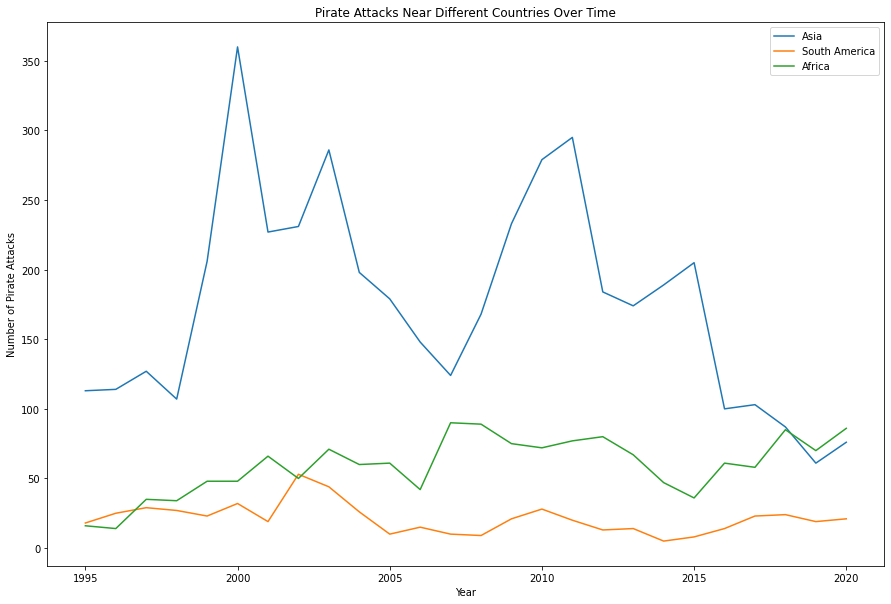

In [152]:
#Create a graph that shows the number of attacks per year for each of the major continents.
temp_pirates = pirates[pirates['Year'] >= 1995].copy()

years = [1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, \
         2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]
attacks_per_year = []

#split the data into each year 
for year in years:
    period = temp_pirates.groupby(['Year']).get_group(year)
    attacks_per_year.append(period) 

Asia = []
South_America = []
Africa = []

for attacks in attacks_per_year:
    Asia_sum = South_America_sum = Africa_sum = 0
    
    for idx, row in attacks.iterrows():
        if row['continent'] == "Asia":
            Asia_sum = Asia_sum + 1
        elif row['continent'] == "South America":
            South_America_sum = South_America_sum + 1
        elif row['continent'] == "Africa":
            Africa_sum = Africa_sum + 1
    
    Asia.append(Asia_sum)
    South_America.append(South_America_sum)
    Africa.append(Africa_sum)

        
#want to see multiple lines on the same plot
plt.figure(figsize=(15,10))
plt.plot(years, Asia, label = "Asia")
plt.plot(years, South_America, label = "South America")
plt.plot(years, Africa, label = "Africa")

plt.title("Pirate Attacks Near Different Countries Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Pirate Attacks")
plt.legend()
plt.show()


In this graph we can see how volitile the number of pirate attacks in Asia is subject to change. We can observe what seems to be two large spikes in pirate activity in the continent around 2000 and 2011, however, after these spikes pirate activity seems to have dropped slightly. Another thing we can observe is that there is somewhat of a slight linear increase in pirate activity in Africa.

## Analysis and Hypothesis Testing

The fourth step in the data life cycle is analyzing data through the use of machine learning and drawing conclusions from it. Here we will be using numpy's polyfit() command to find polynomial regression models for total pirate attacks over time and pirate attacks by continent over time.

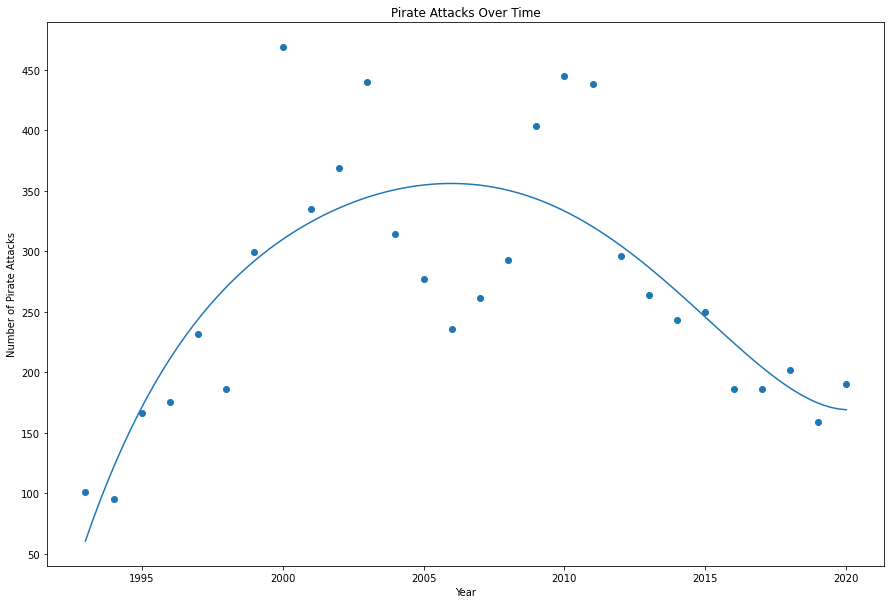

In [168]:
#create a line of regression for pirate attacks over time
#want the line to be a polynomial of a certian degree
years = [1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, \
         2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]

mymodel = np.poly1d(np.polyfit(years, num, 5))
myline = np.linspace(1993, 2020, 100)

plt.figure(figsize=(15,10))
plt.scatter(years, num)
plt.plot(myline, mymodel(myline))

plt.title("Pirate Attacks Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Pirate Attacks")
plt.show()

From this graph we can observe a loose fitting line of regression that indicates that the number of pirate attacks moving forward will slowly plateau. This model identifys the spikes in pirate attacks during 2000, 2003, and 2009-2011, and the following sharp decrease in attacks from 2004-2008 as outliers. 

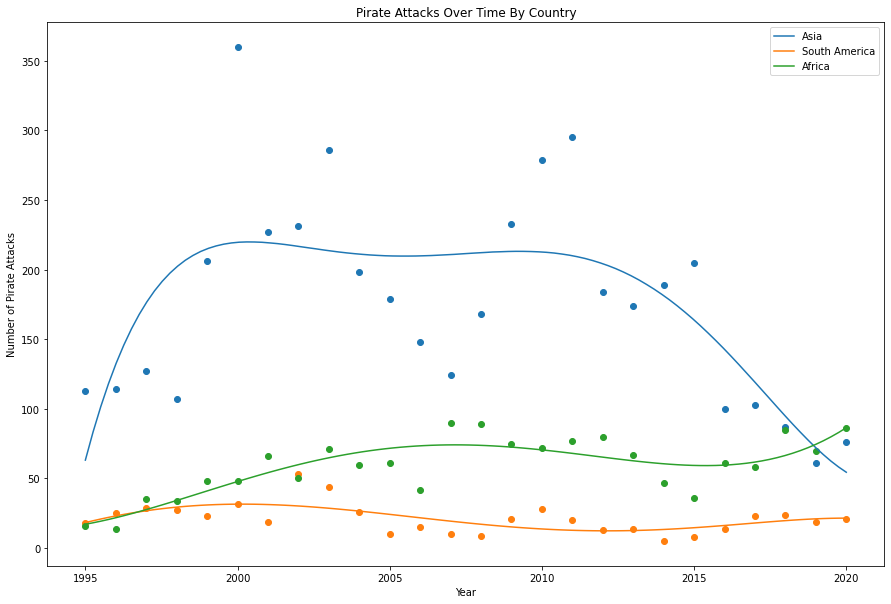

In [175]:
years = [1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, \
         2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]

asia_model = np.poly1d(np.polyfit(years, Asia, 5))
south_america_model = np.poly1d(np.polyfit(years, South_America, 5))
africa_model = np.poly1d(np.polyfit(years, Africa, 4))
myline = np.linspace(1995, 2020, 100)

plt.figure(figsize=(15,10))
plt.scatter(years, Asia)
plt.scatter(years, South_America)
plt.scatter(years, Africa)
plt.plot(myline, asia_model(myline), label="Asia")
plt.plot(myline, south_america_model(myline), label="South America")
plt.plot(myline, africa_model(myline), label="Africa")

plt.title("Pirate Attacks Over Time By Country")
plt.xlabel("Year")
plt.ylabel("Number of Pirate Attacks")
plt.legend()
plt.show()


From this graph we can see that the polyfit model predicts that South America will continue to have a low number of pirate attacks every year and that pirate attacks in Africa will continue to increase. However in this graph we can see that the polyfit model predicts that Asia will have a decrease in pirate attacks, even though Asia seems to be the largest contributing factor.

# Insight 

After gathering, manipulating, visualizing, and analyzing the data on pirate attacks over the past 30 years we can come to the conclusion that, for the most part, pirate attacks will continue to occur at the rate they have been in the recent past unless more preventitive measures are put in place. We observed several spikes in pirate activity and one potential soultion would be to look into Asian policy decisions around 2010-2012 regarding piracy to atempt to find effective policy to combat this issue as since this period of time Asia has had significantly less pirate attacks. 

# References

- CNN Buisness report: https://www.cnn.com/2013/04/12/business/piracy-economy-world-bank/index.html
- Pirate Attack Data: https://zenodo.org/record/4583802
- Pandas: https://pandas.pydata.org/pandas-docs/stable/
- Matplotlib: https://matplotlib.org/
- Folium: https://python-visualization.github.io/folium/
- MarkerCluster: https://python-visualization.github.io/folium/plugins.html#folium.plugins.MarkerCluster
- Polynomial Regression: https://numpy.org/doc/1.18/reference/generated/numpy.polyfit.html